## 1. Import the dependencies

In [1]:
import os
import torch
import torch.nn as nn
import numpy as np
import cv2
import matplotlib.pyplot as plt
import itertools
import random
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
import torch.nn.functional as F
import pandas as pd
import torch_fidelity


In [2]:
SEED = 42
print("Random Seed:", SEED)
random.seed(SEED)
np.random.seed(SEED)
torch_seed = torch.initial_seed()
torch.manual_seed(torch_seed)
print("Torch seed:" , torch_seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

cuda = torch.cuda.is_available()
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

Random Seed: 42
Torch seed: 1722426635407800


## 2. Define your model

In [3]:
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction_ratio=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        
        self.fc = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // reduction_ratio, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels // reduction_ratio, in_channels, 1, bias=False)
        )
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        out = avg_out + max_out
        return self.sigmoid(out)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size, padding=kernel_size//2, bias=False)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x_cat = torch.cat([avg_out, max_out], dim=1)
        out = self.conv(x_cat)
        return self.sigmoid(out)

class CBAM(nn.Module):
    def __init__(self, channels, reduction_ratio=16, kernel_size=7):
        super(CBAM, self).__init__()
        self.channel_att = ChannelAttention(channels, reduction_ratio)
        self.spatial_att = SpatialAttention(kernel_size)
        
    def forward(self, x):
        x = x * self.channel_att(x)
        x = x * self.spatial_att(x)
        return x

class ImprovedResidualBlock(nn.Module):
    def __init__(self, in_features, use_cbam=True):
        super(ImprovedResidualBlock, self).__init__()
        
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, kernel_size=3, padding=0),
            nn.InstanceNorm2d(in_features),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, kernel_size=3, padding=0),
            nn.InstanceNorm2d(in_features)
        )
        
        # Add both SE and CBAM attention
        self.se = SqueezeExcitation(in_features)
        self.use_cbam = use_cbam
        if use_cbam:
            self.cbam = CBAM(in_features)
    
    def forward(self, x):
        out = self.block(x)
        out = self.se(out)  # Apply squeeze-excitation
        if self.use_cbam:
            out = self.cbam(out)  # Apply CBAM
        return x + out  # Skip connection

class SqueezeExcitation(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SqueezeExcitation, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

class SelfAttention(nn.Module):
    def __init__(self, in_dim):
        super(SelfAttention, self).__init__()
        self.query_conv = nn.Conv2d(in_dim, in_dim//8, kernel_size=1)
        self.key_conv = nn.Conv2d(in_dim, in_dim//8, kernel_size=1)
        self.value_conv = nn.Conv2d(in_dim, in_dim, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        
        self.softmax = nn.Softmax(dim=-1)
        
    def forward(self, x):
        batch_size, C, width, height = x.size()
        
        # Project to get query, key, value
        query = self.query_conv(x).view(batch_size, -1, width*height).permute(0, 2, 1)
        key = self.key_conv(x).view(batch_size, -1, width*height)
        value = self.value_conv(x).view(batch_size, -1, width*height)
        
        # Calculate attention map
        attention = torch.bmm(query, key)
        attention = self.softmax(attention)
        
        # Apply attention to value
        out = torch.bmm(value, attention.permute(0, 2, 1))
        out = out.view(batch_size, C, width, height)
        
        # Apply gamma parameter and add to input
        out = self.gamma * out + x
        return out

In [4]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features_d=64):
        super(Discriminator, self).__init__()
        
        self.scale_factor = 16
        
        # Feature extraction layers - shared between patch and global discriminators
        self.feature_extraction = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(in_channels, features_d, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.utils.spectral_norm(nn.Conv2d(features_d, features_d*2, kernel_size=4, stride=2, padding=1)),
            nn.InstanceNorm2d(features_d*2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.utils.spectral_norm(nn.Conv2d(features_d*2, features_d*4, kernel_size=4, stride=2, padding=1)),
            nn.InstanceNorm2d(features_d*4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.utils.spectral_norm(nn.Conv2d(features_d*4, features_d*8, kernel_size=4, stride=2, padding=1)),
            nn.InstanceNorm2d(features_d*8),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        # PatchGAN output
        self.patch_output = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(features_d*8, 1, kernel_size=4, stride=1, padding=1))
        )
        
        # Global discriminator output
        self.global_output = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(features_d*8, 1)
        )
    
    def forward(self, x, get_features=False):
        features = self.feature_extraction(x)
        patch_out = self.patch_output(features)
        global_out = self.global_output(features)
        
        if get_features:
            # Return intermediate features for feature matching loss
            return patch_out, global_out, [features]
        return patch_out, global_out

In [5]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, num_residual_blocks=9, use_attention=True):
        super(Generator, self).__init__()
        
        # Initial convolution block
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(in_channels, 64, kernel_size=7, padding=0),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ]
        
        # Enhanced downsampling with more filters
        in_features = 64
        out_features = in_features * 2
        for _ in range(2):
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features * 2
        
        # Improved residual blocks with attention
        for i in range(num_residual_blocks):
            # Add CBAM to the middle blocks for global coherence
            use_cbam = (i >= 3 and i <= 6)
            model += [ImprovedResidualBlock(in_features, use_cbam=use_cbam)]
        
        # Add self-attention layer for better global coherence
        if use_attention:
            model += [SelfAttention(in_features)]
        
        # Enhanced upsampling pathway
        out_features = in_features // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features // 2
        
        # Output layer
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, in_channels, kernel_size=7, padding=0),
            nn.Tanh()
        ]
        
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        return self.model(x)

In [6]:
def relativistic_loss(real_pred, fake_pred, criterion):
    # Standard GAN uses D(real) and D(fake) independently
    # Relativistic GAN compares real to fake samples
    
    # For patch-level predictions
    real_patch, real_global = real_pred
    fake_patch, fake_global = fake_pred
    
    # Relativistic average for patch outputs
    real_fake_diff_patch = real_patch - fake_patch.mean(0, keepdim=True)
    fake_real_diff_patch = fake_patch - real_patch.mean(0, keepdim=True)
    
    # Relativistic average for global outputs
    real_fake_diff_global = real_global - fake_global.mean(0, keepdim=True)
    fake_real_diff_global = fake_global - real_global.mean(0, keepdim=True)
    
    # Combine losses
    batch_size = real_global.size(0)
    ones = torch.ones(batch_size, 1).cuda() if torch.cuda.is_available() else torch.ones(batch_size, 1)
    zeros = torch.zeros(batch_size, 1).cuda() if torch.cuda.is_available() else torch.zeros(batch_size, 1)
    
    # Patch level loss
    loss_real_patch = criterion(real_fake_diff_patch, torch.ones_like(real_fake_diff_patch))
    loss_fake_patch = criterion(fake_real_diff_patch, torch.zeros_like(fake_real_diff_patch))
    
    # Global level loss
    loss_real_global = nn.BCEWithLogitsLoss()(real_fake_diff_global, ones)
    loss_fake_global = nn.BCEWithLogitsLoss()(fake_real_diff_global, zeros)
    
    # Combine patch and global losses
    loss_real = 0.7 * loss_real_patch + 0.3 * loss_real_global
    loss_fake = 0.7 * loss_fake_patch + 0.3 * loss_fake_global
    
    return (loss_real + loss_fake) / 2

def compute_gradient_penalty(discriminator, real_samples, fake_samples):
    # Random interpolation of real and fake samples
    alpha = torch.rand((real_samples.size(0), 1, 1, 1)).type(Tensor)
    interpolates = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
    
    # Get discriminator output for interpolated images
    patch_interpolates, global_interpolates = discriminator(interpolates)
    
    # Set fake gradients for patch outputs
    fake_patch_grad = torch.ones_like(patch_interpolates).type(Tensor)
    patch_gradients = torch.autograd.grad(
        outputs=patch_interpolates,
        inputs=interpolates,
        grad_outputs=fake_patch_grad,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    
    # Flatten gradients and compute penalty
    patch_gradients = patch_gradients.reshape(real_samples.size(0), -1)
    patch_gradient_penalty = ((patch_gradients.norm(2, dim=1) - 1) ** 2).mean()
    
    # Set fake gradients for global outputs
    fake_global_grad = torch.ones_like(global_interpolates).type(Tensor)
    global_gradients = torch.autograd.grad(
        outputs=global_interpolates,
        inputs=interpolates,
        grad_outputs=fake_global_grad,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    
    # Flatten gradients and compute penalty
    global_gradients = global_gradients.reshape(real_samples.size(0), -1)
    global_gradient_penalty = ((global_gradients.norm(2, dim=1) - 1) ** 2).mean()
    
    # Combined penalty
    return 0.7 * patch_gradient_penalty + 0.3 * global_gradient_penalty

def feature_matching_loss(real_features, fake_features):
    """
    Calculate feature matching loss by comparing features extracted from real and fake images.
    
    Args:
        real_features: List of feature tensors from real images
        fake_features: List of feature tensors from fake images
        
    Returns:
        The mean absolute difference between real and fake features
    """
    # Initialize loss
    loss = 0.0
    
    # Both should be lists of the same length, containing feature maps
    assert len(real_features) == len(fake_features), "Feature lists must have same length"
    
    # Calculate L1 loss between corresponding feature maps
    for real_feat, fake_feat in zip(real_features, fake_features):
        # Make sure feature maps have same shape
        assert real_feat.shape == fake_feat.shape, f"Feature shapes don't match: {real_feat.shape} vs {fake_feat.shape}"
        # Calculate mean absolute error between feature maps
        loss += torch.mean(torch.abs(real_feat - fake_feat))
    
    # Average over number of feature maps
    return loss / len(real_features)

In [7]:
class ImagePool:
    def __init__(self, pool_size=50):
        """Initialize the ImagePool with a specified pool size."""
        self.pool_size = pool_size
        self.num_imgs = 0
        self.images = []

    def query(self, images):
        """
        Returns images from the pool.
        If the pool is not full, add the incoming images.
        Otherwise, randomly choose to return an old image or the current one.
        """
        if self.pool_size == 0:
            return images
        return_images = []
        for image in images:
            image = torch.unsqueeze(image.data, 0)  # add a batch dimension if needed
            if self.num_imgs < self.pool_size:
                self.images.append(image)
                self.num_imgs += 1
                return_images.append(image)
            else:
                # With probability 0.5, use a previously stored image
                if random.uniform(0, 1) > 0.5:
                    idx = random.randint(0, self.pool_size - 1)
                    tmp = self.images[idx].clone()
                    self.images[idx] = image
                    return_images.append(tmp)
                else:
                    return_images.append(image)
        return torch.cat(return_images, 0)

In [8]:
def print_epoch_losses(epoch, gen_losses, gen_AB_losses, gen_BA_losses, id_losses, gan_losses, cycle_losses, fm_losses, discA_losses, discB_losses):
    # Calculate average losses for the epoch
    avg_gen_loss = sum(gen_losses) / len(gen_losses)
    avg_gen_AB_loss = sum(gen_AB_losses) / len(gen_AB_losses)
    avg_gen_BA_loss = sum(gen_BA_losses) / len(gen_BA_losses)
    avg_id_loss = sum(id_losses) / len(id_losses)
    avg_gan_loss = sum(gan_losses) / len(gan_losses)
    avg_cycle_loss = sum(cycle_losses) / len(cycle_losses)
    avg_fm_loss = sum(fm_losses) / len(fm_losses)
    avg_discA_loss = sum(discA_losses) / len(discA_losses)
    avg_discB_loss = sum(discB_losses) / len(discB_losses)
    
    print(f"Epoch {epoch}:")
    print(f"  Generator Total Loss: {avg_gen_loss:.4f}")
    print(f"    G_AB (A->B) Loss:  {avg_gen_AB_loss:.4f}")
    print(f"    G_BA (B->A) Loss:  {avg_gen_BA_loss:.4f}")
    print(f"    Identity Loss:     {avg_id_loss:.4f}")
    print(f"    GAN Loss:          {avg_gan_loss:.4f}")
    print(f"    Cycle Loss:        {avg_cycle_loss:.4f}")
    print(f"    Feature Match:     {avg_fm_loss:.4f}")
    print(f"  Discriminator A Loss: {avg_discA_loss:.4f}")
    print(f"  Discriminator B Loss: {avg_discB_loss:.4f}")

def plot_losses(gen_loss_history, gen_AB_loss_history, gen_BA_loss_history, 
                id_loss_history, gan_loss_history, cycle_loss_history, fm_loss_history,
                discA_loss_history, discB_loss_history):
    epochs = range(1, len(gen_loss_history) + 1)
    
    plt.figure(figsize=(15, 10))
    
    # Plot Generator Losses
    plt.subplot(2, 2, 1)
    plt.plot(epochs, gen_loss_history, label="Total Generator Loss", color="blue")
    plt.plot(epochs, gen_AB_loss_history, label="G_AB Loss", color="cyan", linestyle="dashed")
    plt.plot(epochs, gen_BA_loss_history, label="G_BA Loss", color="magenta", linestyle="dashed")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Generator Total Losses")
    plt.legend()
    plt.grid()
    
    # Plot Component Losses
    plt.subplot(2, 2, 2)
    plt.plot(epochs, id_loss_history, label="Identity Loss", color="green")
    plt.plot(epochs, gan_loss_history, label="GAN Loss", color="red")
    plt.plot(epochs, cycle_loss_history, label="Cycle Loss", color="orange")
    plt.plot(epochs, fm_loss_history, label="Feature Match Loss", color="purple")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Loss Components")
    plt.legend()
    plt.grid()
    
    # Plot Discriminator Losses
    plt.subplot(2, 2, 3)
    plt.plot(epochs, discA_loss_history, label="Discriminator A Loss", color="teal")
    plt.plot(epochs, discB_loss_history, label="Discriminator B Loss", color="brown")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Discriminator Losses")
    plt.legend()
    plt.grid()
    
    # Plot combined important losses for overall view
    plt.subplot(2, 2, 4)
    plt.plot(epochs, gen_loss_history, label="Generator Loss", color="blue")
    plt.plot(epochs, cycle_loss_history, label="Cycle Loss", color="orange")
    plt.plot(epochs, gan_loss_history, label="GAN Loss", color="red")
    plt.plot(epochs, [(a+b)/2 for a, b in zip(discA_loss_history, discB_loss_history)], 
             label="Avg Discriminator Loss", color="purple")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Key Losses")
    plt.legend()
    plt.grid()
    
    plt.tight_layout()
    plt.show()

def show_images(real_A, fake_B, recov_A, real_B, fake_A, recov_B, size=(256, 256), num_samples=5):
    """Display three rows of images: real A, fake B, reconstructed A, real B, fake A, reconstructed B"""
    # Denormalize images from [-1, 1] to [0, 1]
    def denorm(tensor):
        return (tensor * 0.5 + 0.5).clamp(0, 1)
    
    # Create a figure with 3 rows of images
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Only use a subset of images
    real_A = denorm(real_A[:num_samples])
    fake_B = denorm(fake_B[:num_samples])
    recov_A = denorm(recov_A[:num_samples])
    real_B = denorm(real_B[:num_samples])
    fake_A = denorm(fake_A[:num_samples])
    recov_B = denorm(recov_B[:num_samples])
    
    # Create grids from batches of images
    real_A_grid = make_grid(real_A, nrow=num_samples).permute(1, 2, 0).cpu().numpy()
    fake_B_grid = make_grid(fake_B, nrow=num_samples).permute(1, 2, 0).cpu().numpy()
    recov_A_grid = make_grid(recov_A, nrow=num_samples).permute(1, 2, 0).cpu().numpy()
    real_B_grid = make_grid(real_B, nrow=num_samples).permute(1, 2, 0).cpu().numpy()
    fake_A_grid = make_grid(fake_A, nrow=num_samples).permute(1, 2, 0).cpu().numpy()
    recov_B_grid = make_grid(recov_B, nrow=num_samples).permute(1, 2, 0).cpu().numpy()
    
    # Display the images
    axes[0, 0].imshow(real_A_grid)
    axes[0, 0].set_title("Real A (Domain A)")
    axes[0, 0].axis("off")
    
    axes[0, 1].imshow(fake_B_grid)
    axes[0, 1].set_title("Fake B (Generated from A)")
    axes[0, 1].axis("off")
    
    axes[0, 2].imshow(recov_A_grid)
    axes[0, 2].set_title("Reconstructed A")
    axes[0, 2].axis("off")
    
    axes[1, 0].imshow(real_B_grid)
    axes[1, 0].set_title("Real B (Domain B)")
    axes[1, 0].axis("off")
    
    axes[1, 1].imshow(fake_A_grid)
    axes[1, 1].set_title("Fake A (Generated from B)")
    axes[1, 1].axis("off")
    
    axes[1, 2].imshow(recov_B_grid)
    axes[1, 2].set_title("Reconstructed B")
    axes[1, 2].axis("off")
    
    plt.tight_layout()
    plt.show()

In [9]:
image_size = (256, 256)
batch_size = 3
n_epochs = 100
lr = 2e-4
betas = (0.5, 0.999)
lambda_cyc = 10.0
lambda_identity = 5.0
lambda_gan = 1.0
lambda_fm = 5.0
lambda_gp = 10.0
pool_size_A = 50
pool_size_B = 50
num_residual_blocks = 9
use_attention = True
features_d = 64
file_name = "EnhancedCycleGAN-256x256"

In [10]:

"""
Step 3. Define Loss
"""
criterion_GAN = nn.MSELoss()  # For adversarial loss
criterion_cycle = nn.L1Loss()  # For cycle consistency loss
criterion_identity = nn.L1Loss()  # For identity loss

"""
Step 4. Initalize G and D¶
"""
G_AB = Generator(in_channels=3, num_residual_blocks=num_residual_blocks, use_attention=True)
G_BA = Generator(in_channels=3, num_residual_blocks=num_residual_blocks, use_attention=True)
D_A = Discriminator(in_channels=3, features_d=features_d)
D_B = Discriminator(in_channels=3, features_d=features_d)

## Total parameters in CycleGAN should be less than 60MB
total_params = sum(p.numel() for p in G_AB.parameters()) + \
               sum(p.numel() for p in G_BA.parameters()) + \
               sum(p.numel() for p in D_A.parameters()) + \
               sum(p.numel() for p in D_B.parameters())


"""
# modification of parameters computation is forbidden
"""
total_params_million = total_params / (1024 * 1024)
print(f'Total parameters in CycleGAN model: {total_params_million:.2f} million')

cuda = torch.cuda.is_available()
print(f'cuda: {cuda}')
if cuda:
    G_AB = G_AB.cuda()
    D_B = D_B.cuda()
    G_BA = G_BA.cuda()
    D_A = D_A.cuda()

criterion_GAN = criterion_GAN.cuda()
criterion_cycle = criterion_cycle.cuda()
criterion_identity = criterion_identity.cuda()

"""
Step 5. Configure Optimizers
"""

# Optimizers
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), 
                               lr=lr, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr, betas=betas)

# Learning rate schedulers
lr_scheduler_G = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer_G, T_0=10, T_mult=2, eta_min=1e-5
)
lr_scheduler_D_A = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer_D_A, T_0=10, T_mult=2, eta_min=1e-5
)
lr_scheduler_D_B = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer_D_B, T_0=10, T_mult=2, eta_min=1e-5
)

# Image pools
fake_A_pool = ImagePool(pool_size=pool_size_A)
fake_B_pool = ImagePool(pool_size=pool_size_B)

Total parameters in CycleGAN model: 27.34 million
cuda: True


In [11]:
# -------------------------
# Save Model
# -------------------------
def save_checkpoint(model, model_name, torch_seed, checkpoint_dir='checkpoints_best'):
    # Ensure the directory exists
    os.makedirs(checkpoint_dir, exist_ok=True)

    checkpoint = {
        'model': model.state_dict(),
        'torch_seed': torch_seed
    }

    filename = os.path.join(checkpoint_dir, f"{file_name}-{model_name}-best.pth")

    # Save the checkpoint
    torch.save(checkpoint, filename)
    print(f"Model saved to {filename}")

## 3. Load the data

In [12]:
"""
Step 6. DataLoader
"""
from zhirongImageDataset import ImageDataset
data_dir = './'
# data_dir = '/kaggle/input/group-project/image_image_translation'

image_size = (256, 256)
data_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

trainloader = DataLoader(
    ImageDataset(data_dir, mode='train', transforms=data_transforms),
    batch_size = batch_size,
    shuffle = True,
    num_workers = 4,
    pin_memory=True,
    persistent_workers=True,
)

validloader = DataLoader(
    ImageDataset(data_dir, mode='valid', transforms=data_transforms),
    batch_size = batch_size,
    shuffle = False,
)

In [13]:
# Initialize loss tracking lists
gen_loss_history = []
gen_AB_loss_history = []
gen_BA_loss_history = []
id_loss_history = []
gan_loss_history = []
cycle_loss_history = []
fm_loss_history = []
discA_loss_history = []
discB_loss_history = []

## 4. Train your **model**

Epoch 1/100: 100%|██████████| 1320/1320 [13:40<00:00,  1.61batch/s]


Epoch 1:
  Generator Total Loss: 8.4326
    G_AB (A->B) Loss:  4.0469
    G_BA (B->A) Loss:  4.3857
    Identity Loss:     0.1688
    GAN Loss:          0.8996
    Cycle Loss:        0.1910
    Feature Match:     0.1124
  Discriminator A Loss: 12.5696
  Discriminator B Loss: 12.7927


Epoch 2/100: 100%|██████████| 1320/1320 [13:16<00:00,  1.66batch/s]


Epoch 2:
  Generator Total Loss: 7.4215
    G_AB (A->B) Loss:  3.6045
    G_BA (B->A) Loss:  3.8170
    Identity Loss:     0.1330
    GAN Loss:          0.8887
    Cycle Loss:        0.1497
    Feature Match:     0.1320
  Discriminator A Loss: 3.0102
  Discriminator B Loss: 3.1912


Epoch 3/100: 100%|██████████| 1320/1320 [13:17<00:00,  1.65batch/s]


Epoch 3:
  Generator Total Loss: 6.9189
    G_AB (A->B) Loss:  3.3006
    G_BA (B->A) Loss:  3.6183
    Identity Loss:     0.1199
    GAN Loss:          0.8919
    Cycle Loss:        0.1349
    Feature Match:     0.1238
  Discriminator A Loss: 3.1826
  Discriminator B Loss: 3.0227


Epoch 4/100: 100%|██████████| 1320/1320 [13:21<00:00,  1.65batch/s]


Epoch 4:
  Generator Total Loss: 6.7031
    G_AB (A->B) Loss:  3.1918
    G_BA (B->A) Loss:  3.5113
    Identity Loss:     0.1103
    GAN Loss:          0.8606
    Cycle Loss:        0.1237
    Feature Match:     0.1405
  Discriminator A Loss: 2.3466
  Discriminator B Loss: 2.4601


Epoch 5/100: 100%|██████████| 1320/1320 [13:21<00:00,  1.65batch/s]


Epoch 5:
  Generator Total Loss: 6.4721
    G_AB (A->B) Loss:  3.0429
    G_BA (B->A) Loss:  3.4292
    Identity Loss:     0.1021
    GAN Loss:          0.8629
    Cycle Loss:        0.1129
    Feature Match:     0.1466
  Discriminator A Loss: 2.5033
  Discriminator B Loss: 2.1271


Epoch 6/100: 100%|██████████| 1320/1320 [13:24<00:00,  1.64batch/s]


Epoch 6:
  Generator Total Loss: 6.2593
    G_AB (A->B) Loss:  2.9205
    G_BA (B->A) Loss:  3.3388
    Identity Loss:     0.0960
    GAN Loss:          0.8563
    Cycle Loss:        0.1045
    Feature Match:     0.1497
  Discriminator A Loss: 1.7851
  Discriminator B Loss: 1.2768


Epoch 7/100: 100%|██████████| 1320/1320 [13:21<00:00,  1.65batch/s]


Epoch 7:
  Generator Total Loss: 6.0228
    G_AB (A->B) Loss:  2.8770
    G_BA (B->A) Loss:  3.1458
    Identity Loss:     0.0920
    GAN Loss:          0.8803
    Cycle Loss:        0.0983
    Feature Match:     0.1376
  Discriminator A Loss: 1.0916
  Discriminator B Loss: 0.8690


Epoch 8/100: 100%|██████████| 1320/1320 [13:18<00:00,  1.65batch/s]


Epoch 8:
  Generator Total Loss: 5.8778
    G_AB (A->B) Loss:  2.8514
    G_BA (B->A) Loss:  3.0264
    Identity Loss:     0.0880
    GAN Loss:          0.9321
    Cycle Loss:        0.0921
    Feature Match:     0.1291
  Discriminator A Loss: 0.9138
  Discriminator B Loss: 0.6591


Epoch 9/100: 100%|██████████| 1320/1320 [13:22<00:00,  1.64batch/s]


Epoch 9:
  Generator Total Loss: 5.7772
    G_AB (A->B) Loss:  2.8067
    G_BA (B->A) Loss:  2.9705
    Identity Loss:     0.0843
    GAN Loss:          0.9768
    Cycle Loss:        0.0865
    Feature Match:     0.1251
  Discriminator A Loss: 0.7356
  Discriminator B Loss: 0.5734


Epoch 10/100: 100%|██████████| 1320/1320 [13:22<00:00,  1.64batch/s]


Epoch 10:
  Generator Total Loss: 5.7468
    G_AB (A->B) Loss:  2.8040
    G_BA (B->A) Loss:  2.9428
    Identity Loss:     0.0819
    GAN Loss:          1.0140
    Cycle Loss:        0.0825
    Feature Match:     0.1251
  Discriminator A Loss: 0.6590
  Discriminator B Loss: 0.5273


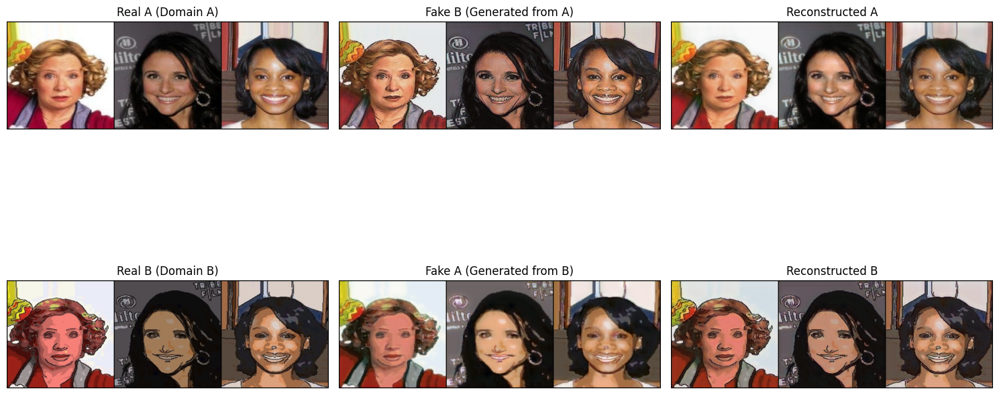

Epoch 11/100: 100%|██████████| 1320/1320 [13:22<00:00,  1.65batch/s]


Epoch 11:
  Generator Total Loss: 6.2557
    G_AB (A->B) Loss:  3.0926
    G_BA (B->A) Loss:  3.1631
    Identity Loss:     0.0977
    GAN Loss:          0.9319
    Cycle Loss:        0.1116
    Feature Match:     0.1183
  Discriminator A Loss: 2.5791
  Discriminator B Loss: 3.9600


Epoch 12/100: 100%|██████████| 1320/1320 [13:21<00:00,  1.65batch/s]


Epoch 12:
  Generator Total Loss: 6.1811
    G_AB (A->B) Loss:  2.9172
    G_BA (B->A) Loss:  3.2639
    Identity Loss:     0.0950
    GAN Loss:          0.8756
    Cycle Loss:        0.1075
    Feature Match:     0.1329
  Discriminator A Loss: 1.2923
  Discriminator B Loss: 2.4570


Epoch 13/100: 100%|██████████| 1320/1320 [13:23<00:00,  1.64batch/s]


Epoch 13:
  Generator Total Loss: 5.9479
    G_AB (A->B) Loss:  2.8309
    G_BA (B->A) Loss:  3.1170
    Identity Loss:     0.0943
    GAN Loss:          0.8457
    Cycle Loss:        0.1058
    Feature Match:     0.1198
  Discriminator A Loss: 0.8938
  Discriminator B Loss: 1.4109


Epoch 14/100: 100%|██████████| 1320/1320 [13:23<00:00,  1.64batch/s]


Epoch 14:
  Generator Total Loss: 5.7780
    G_AB (A->B) Loss:  2.8012
    G_BA (B->A) Loss:  2.9768
    Identity Loss:     0.0925
    GAN Loss:          0.8783
    Cycle Loss:        0.1040
    Feature Match:     0.1018
  Discriminator A Loss: 0.7303
  Discriminator B Loss: 1.0130


Epoch 15/100: 100%|██████████| 1320/1320 [13:22<00:00,  1.64batch/s]


Epoch 15:
  Generator Total Loss: 5.7751
    G_AB (A->B) Loss:  2.8124
    G_BA (B->A) Loss:  2.9627
    Identity Loss:     0.0913
    GAN Loss:          0.9148
    Cycle Loss:        0.1029
    Feature Match:     0.0974
  Discriminator A Loss: 0.6684
  Discriminator B Loss: 0.7243


Epoch 16/100: 100%|██████████| 1320/1320 [13:22<00:00,  1.64batch/s]


Epoch 16:
  Generator Total Loss: 5.7947
    G_AB (A->B) Loss:  2.8018
    G_BA (B->A) Loss:  2.9929
    Identity Loss:     0.0889
    GAN Loss:          0.9730
    Cycle Loss:        0.1003
    Feature Match:     0.0955
  Discriminator A Loss: 0.7049
  Discriminator B Loss: 0.5605


Epoch 17/100: 100%|██████████| 1320/1320 [13:42<00:00,  1.61batch/s]


Epoch 17:
  Generator Total Loss: 5.8794
    G_AB (A->B) Loss:  2.8629
    G_BA (B->A) Loss:  3.0165
    Identity Loss:     0.0880
    GAN Loss:          1.0015
    Cycle Loss:        0.0993
    Feature Match:     0.1010
  Discriminator A Loss: 0.5906
  Discriminator B Loss: 0.5768


Epoch 18/100: 100%|██████████| 1320/1320 [13:39<00:00,  1.61batch/s]


Epoch 18:
  Generator Total Loss: 6.0127
    G_AB (A->B) Loss:  2.9552
    G_BA (B->A) Loss:  3.0575
    Identity Loss:     0.0866
    GAN Loss:          1.0657
    Cycle Loss:        0.0979
    Feature Match:     0.1058
  Discriminator A Loss: 0.5515
  Discriminator B Loss: 0.4801


Epoch 19/100: 100%|██████████| 1320/1320 [13:39<00:00,  1.61batch/s]


Epoch 19:
  Generator Total Loss: 6.0796
    G_AB (A->B) Loss:  3.0172
    G_BA (B->A) Loss:  3.0624
    Identity Loss:     0.0845
    GAN Loss:          1.1124
    Cycle Loss:        0.0954
    Feature Match:     0.1101
  Discriminator A Loss: 0.5370
  Discriminator B Loss: 0.4529


Epoch 20/100: 100%|██████████| 1320/1320 [13:33<00:00,  1.62batch/s]


Epoch 20:
  Generator Total Loss: 5.7812
    G_AB (A->B) Loss:  2.8553
    G_BA (B->A) Loss:  2.9260
    Identity Loss:     0.0811
    GAN Loss:          1.0606
    Cycle Loss:        0.0913
    Feature Match:     0.1022
  Discriminator A Loss: 0.5696
  Discriminator B Loss: 0.5852


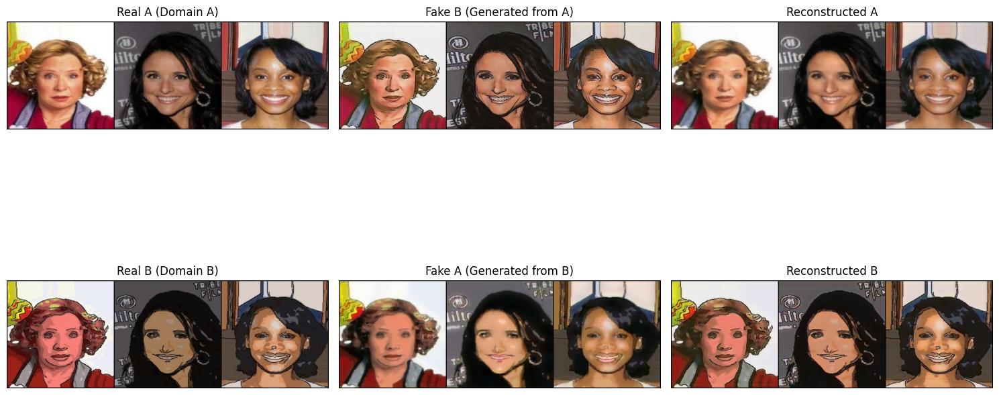

Epoch 21/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 21:
  Generator Total Loss: 5.8818
    G_AB (A->B) Loss:  2.9444
    G_BA (B->A) Loss:  2.9373
    Identity Loss:     0.0787
    GAN Loss:          1.1235
    Cycle Loss:        0.0886
    Feature Match:     0.1076
  Discriminator A Loss: 0.5193
  Discriminator B Loss: 0.4419


Epoch 22/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 22:
  Generator Total Loss: 6.0001
    G_AB (A->B) Loss:  3.0388
    G_BA (B->A) Loss:  2.9613
    Identity Loss:     0.0771
    GAN Loss:          1.1757
    Cycle Loss:        0.0871
    Feature Match:     0.1136
  Discriminator A Loss: 0.5095
  Discriminator B Loss: 0.4217


Epoch 23/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 23:
  Generator Total Loss: 6.0076
    G_AB (A->B) Loss:  3.0859
    G_BA (B->A) Loss:  2.9217
    Identity Loss:     0.0742
    GAN Loss:          1.2153
    Cycle Loss:        0.0836
    Feature Match:     0.1162
  Discriminator A Loss: 0.5036
  Discriminator B Loss: 0.4063


Epoch 24/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 24:
  Generator Total Loss: 5.9707
    G_AB (A->B) Loss:  3.0869
    G_BA (B->A) Loss:  2.8839
    Identity Loss:     0.0718
    GAN Loss:          1.2333
    Cycle Loss:        0.0805
    Feature Match:     0.1175
  Discriminator A Loss: 0.4979
  Discriminator B Loss: 0.4014


Epoch 25/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 25:
  Generator Total Loss: 5.9343
    G_AB (A->B) Loss:  3.0907
    G_BA (B->A) Loss:  2.8436
    Identity Loss:     0.0691
    GAN Loss:          1.2540
    Cycle Loss:        0.0772
    Feature Match:     0.1191
  Discriminator A Loss: 0.4916
  Discriminator B Loss: 0.3967


Epoch 26/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.63batch/s]


Epoch 26:
  Generator Total Loss: 5.9043
    G_AB (A->B) Loss:  3.0960
    G_BA (B->A) Loss:  2.8083
    Identity Loss:     0.0673
    GAN Loss:          1.2691
    Cycle Loss:        0.0745
    Feature Match:     0.1204
  Discriminator A Loss: 0.4854
  Discriminator B Loss: 0.3918


Epoch 27/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 27:
  Generator Total Loss: 5.8566
    G_AB (A->B) Loss:  3.0907
    G_BA (B->A) Loss:  2.7660
    Identity Loss:     0.0651
    GAN Loss:          1.2823
    Cycle Loss:        0.0713
    Feature Match:     0.1214
  Discriminator A Loss: 0.4804
  Discriminator B Loss: 0.3882


Epoch 28/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 28:
  Generator Total Loss: 5.8069
    G_AB (A->B) Loss:  3.0712
    G_BA (B->A) Loss:  2.7357
    Identity Loss:     0.0635
    GAN Loss:          1.2907
    Cycle Loss:        0.0686
    Feature Match:     0.1218
  Discriminator A Loss: 0.4757
  Discriminator B Loss: 0.3853


Epoch 29/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 29:
  Generator Total Loss: 5.7792
    G_AB (A->B) Loss:  3.0683
    G_BA (B->A) Loss:  2.7109
    Identity Loss:     0.0625
    GAN Loss:          1.2950
    Cycle Loss:        0.0670
    Feature Match:     0.1225
  Discriminator A Loss: 0.4728
  Discriminator B Loss: 0.3842


Epoch 30/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 30:
  Generator Total Loss: 5.7592
    G_AB (A->B) Loss:  3.0723
    G_BA (B->A) Loss:  2.6869
    Identity Loss:     0.0614
    GAN Loss:          1.3048
    Cycle Loss:        0.0652
    Feature Match:     0.1232
  Discriminator A Loss: 0.4706
  Discriminator B Loss: 0.3815


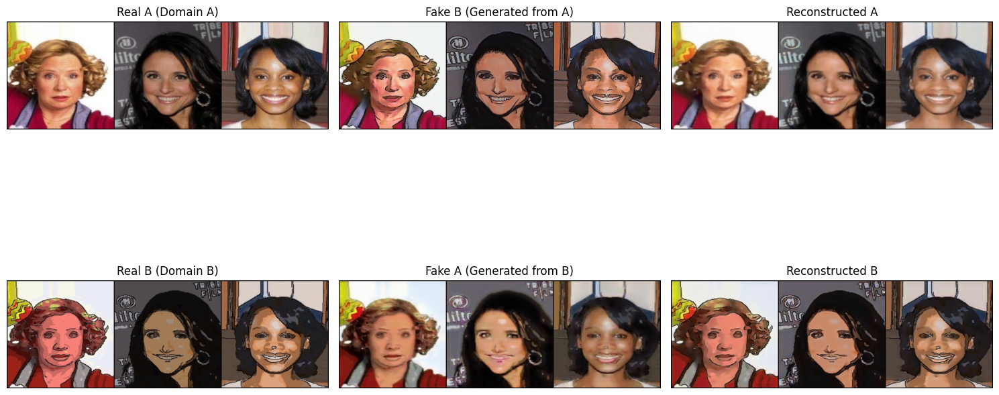

Epoch 31/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.63batch/s]


Epoch 31:
  Generator Total Loss: 5.2862
    G_AB (A->B) Loss:  2.5366
    G_BA (B->A) Loss:  2.7497
    Identity Loss:     0.0799
    GAN Loss:          0.8863
    Cycle Loss:        0.0946
    Feature Match:     0.0824
  Discriminator A Loss: 0.8257
  Discriminator B Loss: 1.2780


Epoch 32/100: 100%|██████████| 1320/1320 [13:33<00:00,  1.62batch/s]


Epoch 32:
  Generator Total Loss: 5.4633
    G_AB (A->B) Loss:  2.6598
    G_BA (B->A) Loss:  2.8035
    Identity Loss:     0.0765
    GAN Loss:          0.9741
    Cycle Loss:        0.0902
    Feature Match:     0.0945
  Discriminator A Loss: 0.5417
  Discriminator B Loss: 0.5886


Epoch 33/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 33:
  Generator Total Loss: 5.9646
    G_AB (A->B) Loss:  2.9926
    G_BA (B->A) Loss:  2.9720
    Identity Loss:     0.0787
    GAN Loss:          1.1045
    Cycle Loss:        0.0940
    Feature Match:     0.1090
  Discriminator A Loss: 0.5142
  Discriminator B Loss: 0.4512


Epoch 34/100: 100%|██████████| 1320/1320 [13:33<00:00,  1.62batch/s]


Epoch 34:
  Generator Total Loss: 5.9544
    G_AB (A->B) Loss:  3.0460
    G_BA (B->A) Loss:  2.9084
    Identity Loss:     0.0790
    GAN Loss:          1.1349
    Cycle Loss:        0.0942
    Feature Match:     0.1011
  Discriminator A Loss: 0.6328
  Discriminator B Loss: 0.4150


Epoch 35/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 35:
  Generator Total Loss: 5.9042
    G_AB (A->B) Loss:  3.0137
    G_BA (B->A) Loss:  2.8905
    Identity Loss:     0.0772
    GAN Loss:          1.1249
    Cycle Loss:        0.0928
    Feature Match:     0.1026
  Discriminator A Loss: 0.5074
  Discriminator B Loss: 0.4990


Epoch 36/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 36:
  Generator Total Loss: 6.1856
    G_AB (A->B) Loss:  3.2482
    G_BA (B->A) Loss:  2.9374
    Identity Loss:     0.0762
    GAN Loss:          1.2407
    Cycle Loss:        0.0925
    Feature Match:     0.1092
  Discriminator A Loss: 0.4964
  Discriminator B Loss: 0.3946


Epoch 37/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 37:
  Generator Total Loss: 6.0412
    G_AB (A->B) Loss:  3.1819
    G_BA (B->A) Loss:  2.8593
    Identity Loss:     0.0744
    GAN Loss:          1.2335
    Cycle Loss:        0.0902
    Feature Match:     0.1025
  Discriminator A Loss: 0.5511
  Discriminator B Loss: 0.3936


Epoch 38/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 38:
  Generator Total Loss: 5.5614
    G_AB (A->B) Loss:  2.8067
    G_BA (B->A) Loss:  2.7547
    Identity Loss:     0.0723
    GAN Loss:          1.0651
    Cycle Loss:        0.0871
    Feature Match:     0.0967
  Discriminator A Loss: 0.4891
  Discriminator B Loss: 0.6463


Epoch 39/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 39:
  Generator Total Loss: 5.7259
    G_AB (A->B) Loss:  2.9826
    G_BA (B->A) Loss:  2.7433
    Identity Loss:     0.0705
    GAN Loss:          1.1712
    Cycle Loss:        0.0855
    Feature Match:     0.0968
  Discriminator A Loss: 0.5539
  Discriminator B Loss: 0.4100


Epoch 40/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 40:
  Generator Total Loss: 5.7917
    G_AB (A->B) Loss:  3.0522
    G_BA (B->A) Loss:  2.7395
    Identity Loss:     0.0694
    GAN Loss:          1.2119
    Cycle Loss:        0.0845
    Feature Match:     0.0984
  Discriminator A Loss: 0.4945
  Discriminator B Loss: 0.3994


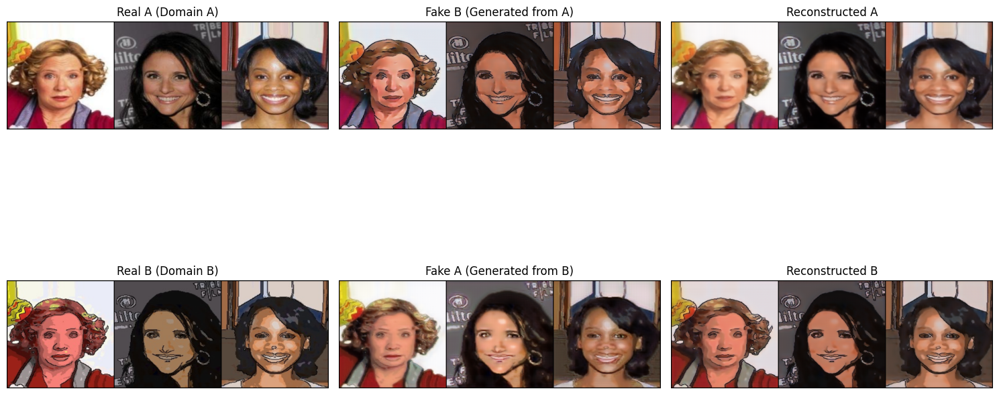

Epoch 41/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 41:
  Generator Total Loss: 5.8691
    G_AB (A->B) Loss:  3.0967
    G_BA (B->A) Loss:  2.7724
    Identity Loss:     0.0677
    GAN Loss:          1.2441
    Cycle Loss:        0.0831
    Feature Match:     0.1042
  Discriminator A Loss: 0.4776
  Discriminator B Loss: 0.3956


Epoch 42/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 42:
  Generator Total Loss: 5.8307
    G_AB (A->B) Loss:  3.0791
    G_BA (B->A) Loss:  2.7515
    Identity Loss:     0.0661
    GAN Loss:          1.2443
    Cycle Loss:        0.0818
    Feature Match:     0.1045
  Discriminator A Loss: 0.4715
  Discriminator B Loss: 0.3957


Epoch 43/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 43:
  Generator Total Loss: 5.6830
    G_AB (A->B) Loss:  2.9833
    G_BA (B->A) Loss:  2.6998
    Identity Loss:     0.0645
    GAN Loss:          1.2122
    Cycle Loss:        0.0799
    Feature Match:     0.1015
  Discriminator A Loss: 0.4659
  Discriminator B Loss: 0.4452


Epoch 44/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 44:
  Generator Total Loss: 5.6714
    G_AB (A->B) Loss:  3.0291
    G_BA (B->A) Loss:  2.6423
    Identity Loss:     0.0629
    GAN Loss:          1.2432
    Cycle Loss:        0.0780
    Feature Match:     0.0996
  Discriminator A Loss: 0.4835
  Discriminator B Loss: 0.3920


Epoch 45/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 45:
  Generator Total Loss: 5.7551
    G_AB (A->B) Loss:  3.0844
    G_BA (B->A) Loss:  2.6707
    Identity Loss:     0.0618
    GAN Loss:          1.2730
    Cycle Loss:        0.0775
    Feature Match:     0.1041
  Discriminator A Loss: 0.4608
  Discriminator B Loss: 0.3896


Epoch 46/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.63batch/s]


Epoch 46:
  Generator Total Loss: 5.6858
    G_AB (A->B) Loss:  3.0403
    G_BA (B->A) Loss:  2.6455
    Identity Loss:     0.0596
    GAN Loss:          1.2735
    Cycle Loss:        0.0748
    Feature Match:     0.1046
  Discriminator A Loss: 0.4551
  Discriminator B Loss: 0.3906


Epoch 47/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 47:
  Generator Total Loss: 5.6520
    G_AB (A->B) Loss:  3.0238
    G_BA (B->A) Loss:  2.6282
    Identity Loss:     0.0579
    GAN Loss:          1.2835
    Cycle Loss:        0.0729
    Feature Match:     0.1048
  Discriminator A Loss: 0.4508
  Discriminator B Loss: 0.3895


Epoch 48/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 48:
  Generator Total Loss: 5.6135
    G_AB (A->B) Loss:  3.0160
    G_BA (B->A) Loss:  2.5975
    Identity Loss:     0.0562
    GAN Loss:          1.2931
    Cycle Loss:        0.0710
    Feature Match:     0.1046
  Discriminator A Loss: 0.4486
  Discriminator B Loss: 0.3877


Epoch 49/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 49:
  Generator Total Loss: 5.5779
    G_AB (A->B) Loss:  3.0018
    G_BA (B->A) Loss:  2.5761
    Identity Loss:     0.0549
    GAN Loss:          1.2971
    Cycle Loss:        0.0692
    Feature Match:     0.1051
  Discriminator A Loss: 0.4463
  Discriminator B Loss: 0.3876


Epoch 50/100: 100%|██████████| 1320/1320 [13:25<00:00,  1.64batch/s]


Epoch 50:
  Generator Total Loss: 5.5418
    G_AB (A->B) Loss:  2.9969
    G_BA (B->A) Loss:  2.5449
    Identity Loss:     0.0532
    GAN Loss:          1.3028
    Cycle Loss:        0.0674
    Feature Match:     0.1055
  Discriminator A Loss: 0.4439
  Discriminator B Loss: 0.3857


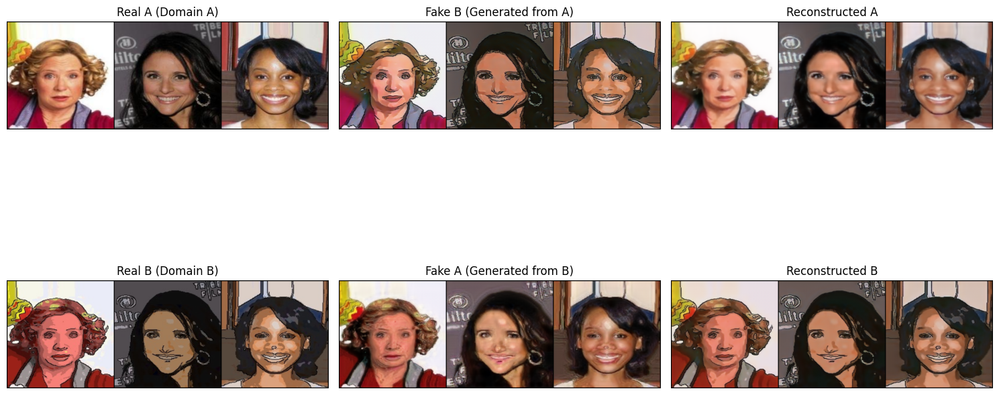

Epoch 51/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 51:
  Generator Total Loss: 5.4935
    G_AB (A->B) Loss:  2.9768
    G_BA (B->A) Loss:  2.5167
    Identity Loss:     0.0517
    GAN Loss:          1.3019
    Cycle Loss:        0.0656
    Feature Match:     0.1062
  Discriminator A Loss: 0.4425
  Discriminator B Loss: 0.3864


Epoch 52/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 52:
  Generator Total Loss: 5.4693
    G_AB (A->B) Loss:  2.9706
    G_BA (B->A) Loss:  2.4986
    Identity Loss:     0.0504
    GAN Loss:          1.3086
    Cycle Loss:        0.0639
    Feature Match:     0.1070
  Discriminator A Loss: 0.4416
  Discriminator B Loss: 0.3835


Epoch 53/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 53:
  Generator Total Loss: 5.4363
    G_AB (A->B) Loss:  2.9580
    G_BA (B->A) Loss:  2.4783
    Identity Loss:     0.0492
    GAN Loss:          1.3116
    Cycle Loss:        0.0623
    Feature Match:     0.1075
  Discriminator A Loss: 0.4396
  Discriminator B Loss: 0.3838


Epoch 54/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 54:
  Generator Total Loss: 5.3876
    G_AB (A->B) Loss:  2.9438
    G_BA (B->A) Loss:  2.4438
    Identity Loss:     0.0474
    GAN Loss:          1.3154
    Cycle Loss:        0.0602
    Feature Match:     0.1080
  Discriminator A Loss: 0.4378
  Discriminator B Loss: 0.3831


Epoch 55/100: 100%|██████████| 1320/1320 [13:25<00:00,  1.64batch/s]


Epoch 55:
  Generator Total Loss: 5.3686
    G_AB (A->B) Loss:  2.9378
    G_BA (B->A) Loss:  2.4308
    Identity Loss:     0.0462
    GAN Loss:          1.3193
    Cycle Loss:        0.0590
    Feature Match:     0.1089
  Discriminator A Loss: 0.4364
  Discriminator B Loss: 0.3832


Epoch 56/100: 100%|██████████| 1320/1320 [13:28<00:00,  1.63batch/s]


Epoch 56:
  Generator Total Loss: 5.3339
    G_AB (A->B) Loss:  2.9251
    G_BA (B->A) Loss:  2.4088
    Identity Loss:     0.0450
    GAN Loss:          1.3217
    Cycle Loss:        0.0573
    Feature Match:     0.1094
  Discriminator A Loss: 0.4359
  Discriminator B Loss: 0.3819


Epoch 57/100: 100%|██████████| 1320/1320 [13:33<00:00,  1.62batch/s]


Epoch 57:
  Generator Total Loss: 5.3008
    G_AB (A->B) Loss:  2.9115
    G_BA (B->A) Loss:  2.3892
    Identity Loss:     0.0438
    GAN Loss:          1.3236
    Cycle Loss:        0.0558
    Feature Match:     0.1099
  Discriminator A Loss: 0.4348
  Discriminator B Loss: 0.3813


Epoch 58/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 58:
  Generator Total Loss: 5.2644
    G_AB (A->B) Loss:  2.8974
    G_BA (B->A) Loss:  2.3670
    Identity Loss:     0.0426
    GAN Loss:          1.3229
    Cycle Loss:        0.0544
    Feature Match:     0.1103
  Discriminator A Loss: 0.4338
  Discriminator B Loss: 0.3810


Epoch 59/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 59:
  Generator Total Loss: 5.2288
    G_AB (A->B) Loss:  2.8780
    G_BA (B->A) Loss:  2.3508
    Identity Loss:     0.0415
    GAN Loss:          1.3236
    Cycle Loss:        0.0529
    Feature Match:     0.1108
  Discriminator A Loss: 0.4326
  Discriminator B Loss: 0.3808


Epoch 60/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 60:
  Generator Total Loss: 5.2038
    G_AB (A->B) Loss:  2.8701
    G_BA (B->A) Loss:  2.3336
    Identity Loss:     0.0405
    GAN Loss:          1.3266
    Cycle Loss:        0.0517
    Feature Match:     0.1111
  Discriminator A Loss: 0.4316
  Discriminator B Loss: 0.3801


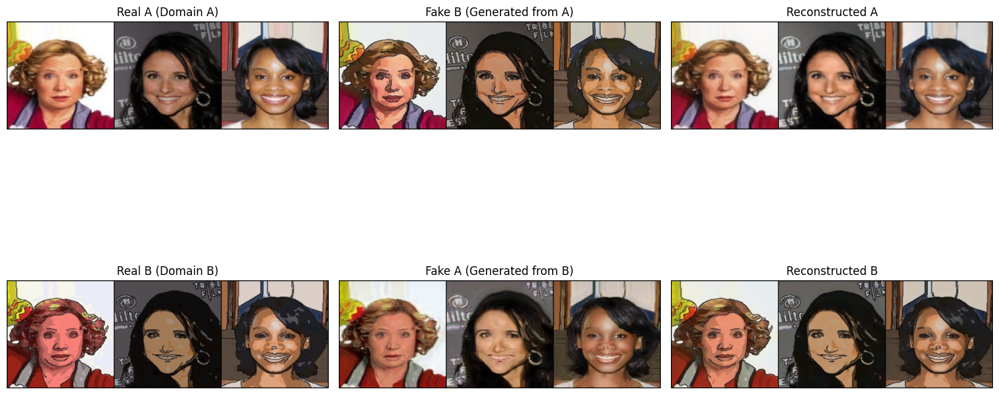

Epoch 61/100: 100%|██████████| 1320/1320 [13:34<00:00,  1.62batch/s]


Epoch 61:
  Generator Total Loss: 5.1804
    G_AB (A->B) Loss:  2.8608
    G_BA (B->A) Loss:  2.3195
    Identity Loss:     0.0397
    GAN Loss:          1.3275
    Cycle Loss:        0.0506
    Feature Match:     0.1115
  Discriminator A Loss: 0.4314
  Discriminator B Loss: 0.3797


Epoch 62/100: 100%|██████████| 1320/1320 [13:51<00:00,  1.59batch/s]


Epoch 62:
  Generator Total Loss: 5.1573
    G_AB (A->B) Loss:  2.8520
    G_BA (B->A) Loss:  2.3053
    Identity Loss:     0.0388
    GAN Loss:          1.3290
    Cycle Loss:        0.0496
    Feature Match:     0.1120
  Discriminator A Loss: 0.4303
  Discriminator B Loss: 0.3790


Epoch 63/100: 100%|██████████| 1320/1320 [13:46<00:00,  1.60batch/s]


Epoch 63:
  Generator Total Loss: 5.1260
    G_AB (A->B) Loss:  2.8348
    G_BA (B->A) Loss:  2.2912
    Identity Loss:     0.0381
    GAN Loss:          1.3276
    Cycle Loss:        0.0484
    Feature Match:     0.1122
  Discriminator A Loss: 0.4299
  Discriminator B Loss: 0.3793


Epoch 64/100: 100%|██████████| 1320/1320 [13:46<00:00,  1.60batch/s]


Epoch 64:
  Generator Total Loss: 5.1063
    G_AB (A->B) Loss:  2.8273
    G_BA (B->A) Loss:  2.2791
    Identity Loss:     0.0375
    GAN Loss:          1.3280
    Cycle Loss:        0.0475
    Feature Match:     0.1126
  Discriminator A Loss: 0.4291
  Discriminator B Loss: 0.3789


Epoch 65/100: 100%|██████████| 1320/1320 [13:28<00:00,  1.63batch/s]


Epoch 65:
  Generator Total Loss: 5.0830
    G_AB (A->B) Loss:  2.8170
    G_BA (B->A) Loss:  2.2660
    Identity Loss:     0.0368
    GAN Loss:          1.3269
    Cycle Loss:        0.0467
    Feature Match:     0.1127
  Discriminator A Loss: 0.4293
  Discriminator B Loss: 0.3785


Epoch 66/100: 100%|██████████| 1320/1320 [13:29<00:00,  1.63batch/s]


Epoch 66:
  Generator Total Loss: 5.0652
    G_AB (A->B) Loss:  2.8081
    G_BA (B->A) Loss:  2.2571
    Identity Loss:     0.0364
    GAN Loss:          1.3267
    Cycle Loss:        0.0460
    Feature Match:     0.1128
  Discriminator A Loss: 0.4283
  Discriminator B Loss: 0.3782


Epoch 67/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 67:
  Generator Total Loss: 5.0518
    G_AB (A->B) Loss:  2.8017
    G_BA (B->A) Loss:  2.2501
    Identity Loss:     0.0360
    GAN Loss:          1.3263
    Cycle Loss:        0.0454
    Feature Match:     0.1131
  Discriminator A Loss: 0.4280
  Discriminator B Loss: 0.3784


Epoch 68/100: 100%|██████████| 1320/1320 [14:07<00:00,  1.56batch/s]


Epoch 68:
  Generator Total Loss: 5.0342
    G_AB (A->B) Loss:  2.7934
    G_BA (B->A) Loss:  2.2408
    Identity Loss:     0.0357
    GAN Loss:          1.3244
    Cycle Loss:        0.0449
    Feature Match:     0.1131
  Discriminator A Loss: 0.4282
  Discriminator B Loss: 0.3779


Epoch 69/100: 100%|██████████| 1320/1320 [13:37<00:00,  1.62batch/s]


Epoch 69:
  Generator Total Loss: 5.0248
    G_AB (A->B) Loss:  2.7880
    G_BA (B->A) Loss:  2.2369
    Identity Loss:     0.0354
    GAN Loss:          1.3231
    Cycle Loss:        0.0446
    Feature Match:     0.1133
  Discriminator A Loss: 0.4279
  Discriminator B Loss: 0.3780


Epoch 70/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 70:
  Generator Total Loss: 5.0139
    G_AB (A->B) Loss:  2.7827
    G_BA (B->A) Loss:  2.2312
    Identity Loss:     0.0352
    GAN Loss:          1.3217
    Cycle Loss:        0.0442
    Feature Match:     0.1134
  Discriminator A Loss: 0.4283
  Discriminator B Loss: 0.3783


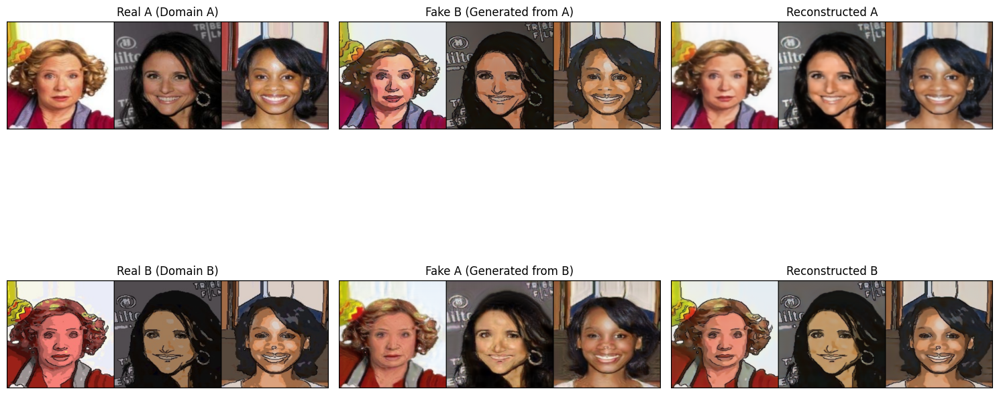

Epoch 71/100: 100%|██████████| 1320/1320 [13:33<00:00,  1.62batch/s]


Epoch 71:
  Generator Total Loss: 5.7746
    G_AB (A->B) Loss:  3.0626
    G_BA (B->A) Loss:  2.7120
    Identity Loss:     0.0653
    GAN Loss:          1.1993
    Cycle Loss:        0.0877
    Feature Match:     0.0969
  Discriminator A Loss: 0.5214
  Discriminator B Loss: 0.4491


Epoch 72/100: 100%|██████████| 1320/1320 [13:35<00:00,  1.62batch/s]


Epoch 72:
  Generator Total Loss: 5.8680
    G_AB (A->B) Loss:  3.1677
    G_BA (B->A) Loss:  2.7003
    Identity Loss:     0.0584
    GAN Loss:          1.3258
    Cycle Loss:        0.0776
    Feature Match:     0.1080
  Discriminator A Loss: 0.4407
  Discriminator B Loss: 0.3871


Epoch 73/100: 100%|██████████| 1320/1320 [13:36<00:00,  1.62batch/s]


Epoch 73:
  Generator Total Loss: 5.7653
    G_AB (A->B) Loss:  3.1162
    G_BA (B->A) Loss:  2.6491
    Identity Loss:     0.0567
    GAN Loss:          1.3093
    Cycle Loss:        0.0754
    Feature Match:     0.1070
  Discriminator A Loss: 0.4599
  Discriminator B Loss: 0.3869


Epoch 74/100: 100%|██████████| 1320/1320 [13:34<00:00,  1.62batch/s]


Epoch 74:
  Generator Total Loss: 5.7304
    G_AB (A->B) Loss:  3.1222
    G_BA (B->A) Loss:  2.6082
    Identity Loss:     0.0558
    GAN Loss:          1.3163
    Cycle Loss:        0.0743
    Feature Match:     0.1053
  Discriminator A Loss: 0.4509
  Discriminator B Loss: 0.3805


Epoch 75/100: 100%|██████████| 1320/1320 [13:36<00:00,  1.62batch/s]


Epoch 75:
  Generator Total Loss: 5.7052
    G_AB (A->B) Loss:  3.0783
    G_BA (B->A) Loss:  2.6269
    Identity Loss:     0.0553
    GAN Loss:          1.3049
    Cycle Loss:        0.0736
    Feature Match:     0.1071
  Discriminator A Loss: 0.4395
  Discriminator B Loss: 0.4027


Epoch 76/100: 100%|██████████| 1320/1320 [13:35<00:00,  1.62batch/s]


Epoch 76:
  Generator Total Loss: 5.6892
    G_AB (A->B) Loss:  3.0776
    G_BA (B->A) Loss:  2.6117
    Identity Loss:     0.0548
    GAN Loss:          1.3172
    Cycle Loss:        0.0729
    Feature Match:     0.1048
  Discriminator A Loss: 0.4377
  Discriminator B Loss: 0.3848


Epoch 77/100: 100%|██████████| 1320/1320 [13:31<00:00,  1.63batch/s]


Epoch 77:
  Generator Total Loss: 5.7045
    G_AB (A->B) Loss:  3.1092
    G_BA (B->A) Loss:  2.5954
    Identity Loss:     0.0533
    GAN Loss:          1.3436
    Cycle Loss:        0.0712
    Feature Match:     0.1059
  Discriminator A Loss: 0.4411
  Discriminator B Loss: 0.3782


Epoch 78/100: 100%|██████████| 1320/1320 [13:32<00:00,  1.62batch/s]


Epoch 78:
  Generator Total Loss: 5.6720
    G_AB (A->B) Loss:  3.0780
    G_BA (B->A) Loss:  2.5940
    Identity Loss:     0.0530
    GAN Loss:          1.3329
    Cycle Loss:        0.0708
    Feature Match:     0.1061
  Discriminator A Loss: 0.4357
  Discriminator B Loss: 0.3841


Epoch 79/100: 100%|██████████| 1320/1320 [13:34<00:00,  1.62batch/s]


Epoch 79:
  Generator Total Loss: 5.6308
    G_AB (A->B) Loss:  3.0479
    G_BA (B->A) Loss:  2.5828
    Identity Loss:     0.0526
    GAN Loss:          1.3270
    Cycle Loss:        0.0702
    Feature Match:     0.1046
  Discriminator A Loss: 0.4369
  Discriminator B Loss: 0.3898


Epoch 80/100: 100%|██████████| 1320/1320 [13:35<00:00,  1.62batch/s]


Epoch 80:
  Generator Total Loss: 5.6759
    G_AB (A->B) Loss:  3.0855
    G_BA (B->A) Loss:  2.5904
    Identity Loss:     0.0520
    GAN Loss:          1.3562
    Cycle Loss:        0.0692
    Feature Match:     0.1060
  Discriminator A Loss: 0.4324
  Discriminator B Loss: 0.3771


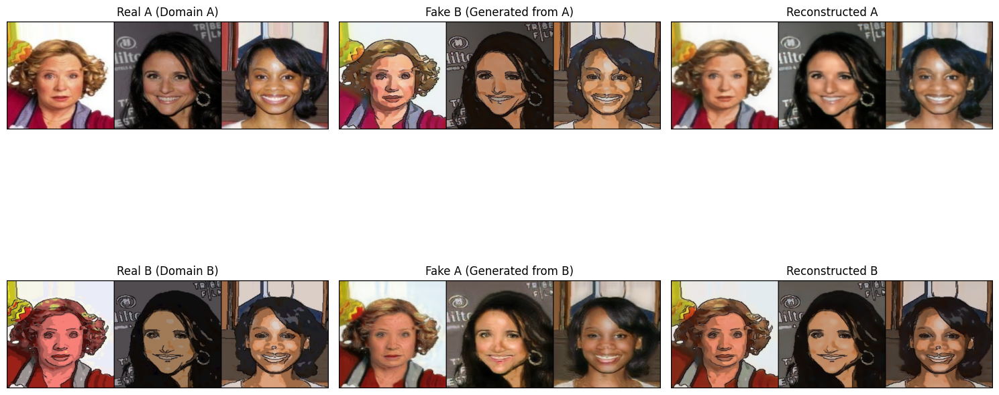

Epoch 81/100: 100%|██████████| 1320/1320 [13:35<00:00,  1.62batch/s]


Epoch 81:
  Generator Total Loss: 5.6183
    G_AB (A->B) Loss:  3.0537
    G_BA (B->A) Loss:  2.5646
    Identity Loss:     0.0507
    GAN Loss:          1.3468
    Cycle Loss:        0.0681
    Feature Match:     0.1055
  Discriminator A Loss: 0.4301
  Discriminator B Loss: 0.3813


Epoch 82/100: 100%|██████████| 1320/1320 [13:36<00:00,  1.62batch/s]


Epoch 82:
  Generator Total Loss: 5.6308
    G_AB (A->B) Loss:  3.0620
    G_BA (B->A) Loss:  2.5688
    Identity Loss:     0.0505
    GAN Loss:          1.3528
    Cycle Loss:        0.0678
    Feature Match:     0.1065
  Discriminator A Loss: 0.4288
  Discriminator B Loss: 0.3808


Epoch 83/100: 100%|██████████| 1320/1320 [13:35<00:00,  1.62batch/s]


Epoch 83:
  Generator Total Loss: 5.5233
    G_AB (A->B) Loss:  3.0158
    G_BA (B->A) Loss:  2.5075
    Identity Loss:     0.0490
    GAN Loss:          1.3431
    Cycle Loss:        0.0660
    Feature Match:     0.1027
  Discriminator A Loss: 0.4499
  Discriminator B Loss: 0.3779


Epoch 84/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 84:
  Generator Total Loss: 5.5709
    G_AB (A->B) Loss:  3.0251
    G_BA (B->A) Loss:  2.5458
    Identity Loss:     0.0487
    GAN Loss:          1.3550
    Cycle Loss:        0.0659
    Feature Match:     0.1057
  Discriminator A Loss: 0.4256
  Discriminator B Loss: 0.3807


Epoch 85/100: 100%|██████████| 1320/1320 [13:26<00:00,  1.64batch/s]


Epoch 85:
  Generator Total Loss: 5.5829
    G_AB (A->B) Loss:  3.0431
    G_BA (B->A) Loss:  2.5398
    Identity Loss:     0.0487
    GAN Loss:          1.3578
    Cycle Loss:        0.0660
    Feature Match:     0.1061
  Discriminator A Loss: 0.4270
  Discriminator B Loss: 0.3795


Epoch 86/100: 100%|██████████| 1320/1320 [13:30<00:00,  1.63batch/s]


Epoch 86:
  Generator Total Loss: 5.5517
    G_AB (A->B) Loss:  3.0344
    G_BA (B->A) Loss:  2.5173
    Identity Loss:     0.0473
    GAN Loss:          1.3652
    Cycle Loss:        0.0641
    Feature Match:     0.1066
  Discriminator A Loss: 0.4271
  Discriminator B Loss: 0.3765


Epoch 87/100: 100%|██████████| 1320/1320 [14:41<00:00,  1.50batch/s]


Epoch 87:
  Generator Total Loss: 5.5150
    G_AB (A->B) Loss:  3.0104
    G_BA (B->A) Loss:  2.5046
    Identity Loss:     0.0467
    GAN Loss:          1.3571
    Cycle Loss:        0.0633
    Feature Match:     0.1067
  Discriminator A Loss: 0.4259
  Discriminator B Loss: 0.3798


Epoch 88/100: 100%|██████████| 1320/1320 [13:53<00:00,  1.58batch/s]


Epoch 88:
  Generator Total Loss: 5.5539
    G_AB (A->B) Loss:  3.0438
    G_BA (B->A) Loss:  2.5101
    Identity Loss:     0.0468
    GAN Loss:          1.3742
    Cycle Loss:        0.0633
    Feature Match:     0.1071
  Discriminator A Loss: 0.4272
  Discriminator B Loss: 0.3744


Epoch 89/100: 100%|██████████| 1320/1320 [13:41<00:00,  1.61batch/s]


Epoch 89:
  Generator Total Loss: 5.5135
    G_AB (A->B) Loss:  3.0221
    G_BA (B->A) Loss:  2.4913
    Identity Loss:     0.0461
    GAN Loss:          1.3620
    Cycle Loss:        0.0626
    Feature Match:     0.1076
  Discriminator A Loss: 0.4265
  Discriminator B Loss: 0.3765


Epoch 90/100: 100%|██████████| 1320/1320 [13:26<00:00,  1.64batch/s]


Epoch 90:
  Generator Total Loss: 5.4988
    G_AB (A->B) Loss:  3.0168
    G_BA (B->A) Loss:  2.4820
    Identity Loss:     0.0452
    GAN Loss:          1.3661
    Cycle Loss:        0.0618
    Feature Match:     0.1079
  Discriminator A Loss: 0.4258
  Discriminator B Loss: 0.3749


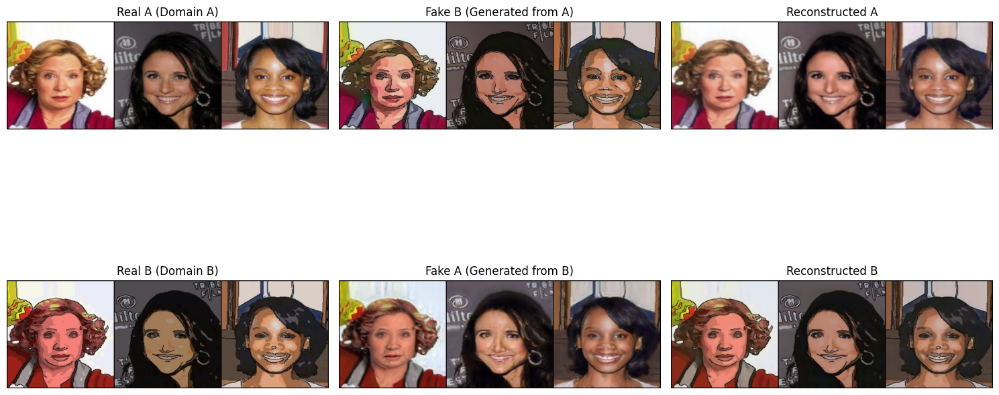

Epoch 91/100: 100%|██████████| 1320/1320 [13:26<00:00,  1.64batch/s]


Epoch 91:
  Generator Total Loss: 5.4865
    G_AB (A->B) Loss:  3.0118
    G_BA (B->A) Loss:  2.4747
    Identity Loss:     0.0445
    GAN Loss:          1.3705
    Cycle Loss:        0.0610
    Feature Match:     0.1080
  Discriminator A Loss: 0.4256
  Discriminator B Loss: 0.3759


Epoch 92/100: 100%|██████████| 1320/1320 [13:27<00:00,  1.63batch/s]


Epoch 92:
  Generator Total Loss: 5.4668
    G_AB (A->B) Loss:  3.0073
    G_BA (B->A) Loss:  2.4596
    Identity Loss:     0.0440
    GAN Loss:          1.3664
    Cycle Loss:        0.0604
    Feature Match:     0.1085
  Discriminator A Loss: 0.4260
  Discriminator B Loss: 0.3747


Epoch 93/100: 100%|██████████| 1320/1320 [13:27<00:00,  1.63batch/s]


Epoch 93:
  Generator Total Loss: 5.4731
    G_AB (A->B) Loss:  3.0150
    G_BA (B->A) Loss:  2.4581
    Identity Loss:     0.0436
    GAN Loss:          1.3726
    Cycle Loss:        0.0600
    Feature Match:     0.1092
  Discriminator A Loss: 0.4248
  Discriminator B Loss: 0.3741


Epoch 94/100: 100%|██████████| 1320/1320 [13:27<00:00,  1.64batch/s]


Epoch 94:
  Generator Total Loss: 5.4341
    G_AB (A->B) Loss:  2.9916
    G_BA (B->A) Loss:  2.4425
    Identity Loss:     0.0428
    GAN Loss:          1.3672
    Cycle Loss:        0.0589
    Feature Match:     0.1093
  Discriminator A Loss: 0.4254
  Discriminator B Loss: 0.3738


Epoch 95/100: 100%|██████████| 1320/1320 [13:27<00:00,  1.63batch/s]


Epoch 95:
  Generator Total Loss: 5.4302
    G_AB (A->B) Loss:  3.0030
    G_BA (B->A) Loss:  2.4272
    Identity Loss:     0.0420
    GAN Loss:          1.3762
    Cycle Loss:        0.0579
    Feature Match:     0.1100
  Discriminator A Loss: 0.4243
  Discriminator B Loss: 0.3720


Epoch 96/100: 100%|██████████| 1320/1320 [13:27<00:00,  1.64batch/s]


Epoch 96:
  Generator Total Loss: 5.4156
    G_AB (A->B) Loss:  2.9918
    G_BA (B->A) Loss:  2.4238
    Identity Loss:     0.0414
    GAN Loss:          1.3750
    Cycle Loss:        0.0575
    Feature Match:     0.1102
  Discriminator A Loss: 0.4242
  Discriminator B Loss: 0.3725


Epoch 97/100: 100%|██████████| 1320/1320 [14:06<00:00,  1.56batch/s]


Epoch 97:
  Generator Total Loss: 5.4317
    G_AB (A->B) Loss:  2.9964
    G_BA (B->A) Loss:  2.4354
    Identity Loss:     0.0411
    GAN Loss:          1.3816
    Cycle Loss:        0.0574
    Feature Match:     0.1110
  Discriminator A Loss: 0.4214
  Discriminator B Loss: 0.3724


Epoch 98/100: 100%|██████████| 1320/1320 [13:58<00:00,  1.57batch/s]


Epoch 98:
  Generator Total Loss: 5.3808
    G_AB (A->B) Loss:  2.9669
    G_BA (B->A) Loss:  2.4139
    Identity Loss:     0.0404
    GAN Loss:          1.3711
    Cycle Loss:        0.0562
    Feature Match:     0.1111
  Discriminator A Loss: 0.4233
  Discriminator B Loss: 0.3737


Epoch 99/100: 100%|██████████| 1320/1320 [13:38<00:00,  1.61batch/s]


Epoch 99:
  Generator Total Loss: 5.3841
    G_AB (A->B) Loss:  2.9740
    G_BA (B->A) Loss:  2.4102
    Identity Loss:     0.0398
    GAN Loss:          1.3818
    Cycle Loss:        0.0553
    Feature Match:     0.1116
  Discriminator A Loss: 0.4206
  Discriminator B Loss: 0.3728


Epoch 100/100: 100%|██████████| 1320/1320 [14:15<00:00,  1.54batch/s]


Epoch 100:
  Generator Total Loss: 5.3489
    G_AB (A->B) Loss:  2.9556
    G_BA (B->A) Loss:  2.3933
    Identity Loss:     0.0389
    GAN Loss:          1.3767
    Cycle Loss:        0.0543
    Feature Match:     0.1120
  Discriminator A Loss: 0.4215
  Discriminator B Loss: 0.3732


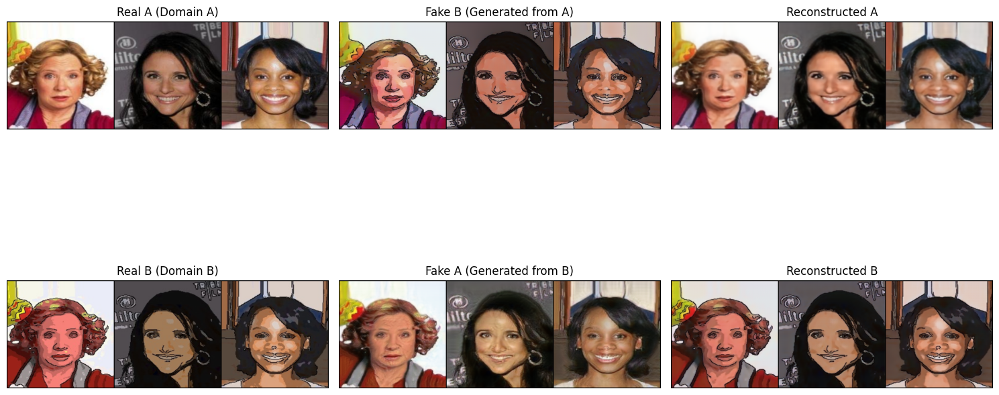

In [14]:
from tqdm import tqdm
# Training loop
for epoch in range(n_epochs):
    # Initialize epoch loss tracking
    epoch_gen_losses = []
    epoch_gen_AB_losses = []
    epoch_gen_BA_losses = []
    epoch_id_losses = []
    epoch_gan_losses = []
    epoch_cycle_losses = []
    epoch_fm_losses = []
    epoch_discA_losses = []
    epoch_discB_losses = []
    
    # Iterate through batches
    for real_A, real_B in tqdm(trainloader, unit="batch", desc=f"Epoch {epoch+1}/{n_epochs}"):
        real_A, real_B = real_A.type(Tensor).to(), real_B.type(Tensor)
        batch_size = real_A.size(0)
        
        # Set models to training mode
        G_AB.train()
        G_BA.train()
        D_A.train()
        D_B.train()
        
        # Ground truth labels
        valid = torch.ones((batch_size, 1, real_A.size(2) // D_A.scale_factor, 
                          real_A.size(3) // D_A.scale_factor)).type(Tensor)
        fake = torch.zeros((batch_size, 1, real_A.size(2) // D_A.scale_factor, 
                          real_A.size(3) // D_A.scale_factor)).type(Tensor)
        
        # Binary labels for global discriminator
        valid_global = torch.ones(batch_size, 1).type(Tensor)
        fake_global = torch.zeros(batch_size, 1).type(Tensor)
        
        #------------------
        # Train Generators
        #------------------
        optimizer_G.zero_grad()
        
        # Generate fake images
        fake_B = G_AB(real_A)
        fake_A = G_BA(real_B)
        
        # Identity loss
        loss_id_A = criterion_identity(G_BA(real_A), real_A)
        loss_id_B = criterion_identity(G_AB(real_B), real_B)
        loss_identity = (loss_id_A + loss_id_B) / 2
        
        # GAN loss with feature extraction for feature matching
        patch_real_A, global_real_A, features_real_A = D_A(real_A, get_features=True)
        patch_fake_A, global_fake_A, features_fake_A = D_A(fake_A, get_features=True)
        patch_real_B, global_real_B, features_real_B = D_B(real_B, get_features=True)
        patch_fake_B, global_fake_B, features_fake_B = D_B(fake_B, get_features=True)
        
        # Relativistic average GAN loss for generators
        loss_GAN_AB = 0.7 * F.mse_loss(patch_fake_B - patch_real_B.mean(0, keepdim=True), 
                                      torch.ones_like(patch_fake_B)) + \
                      0.3 * F.binary_cross_entropy_with_logits(
                          global_fake_B - global_real_B.mean(0, keepdim=True), valid_global)
        
        loss_GAN_BA = 0.7 * F.mse_loss(patch_fake_A - patch_real_A.mean(0, keepdim=True), 
                                      torch.ones_like(patch_fake_A)) + \
                      0.3 * F.binary_cross_entropy_with_logits(
                          global_fake_A - global_real_A.mean(0, keepdim=True), valid_global)
        
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2
        
        # Feature matching loss
        loss_FM_A = feature_matching_loss(features_real_A, features_fake_A)
        loss_FM_B = feature_matching_loss(features_real_B, features_fake_B)
        loss_FM = (loss_FM_A + loss_FM_B) / 2 
        
        # Cycle consistency loss
        recov_A = G_BA(fake_B)
        recov_B = G_AB(fake_A)
        loss_cycle_A = criterion_cycle(recov_A, real_A)
        loss_cycle_B = criterion_cycle(recov_B, real_B)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2
        
        # Total generator loss with adaptive weights
        loss_G_AB = lambda_identity * loss_id_A + lambda_gan * loss_GAN_AB + \
                    lambda_cyc * loss_cycle_A + lambda_fm * loss_FM_A
        
        loss_G_BA = lambda_identity * loss_id_B + lambda_gan * loss_GAN_BA + \
                    lambda_cyc * loss_cycle_B + lambda_fm * loss_FM_B
        
        loss_G = loss_G_AB + loss_G_BA
        
        # Backward pass and optimize
        loss_G.backward()
        optimizer_G.step()
        
        #------------------
        # Train Discriminator A
        #------------------
        optimizer_D_A.zero_grad()
        
        # Get real and fake samples (using pool for fake samples)
        fake_A_ = fake_A_pool.query(fake_A.detach())
        
        # Get discriminator outputs
        real_patch_A, real_global_A = D_A(real_A)
        fake_patch_A, fake_global_A = D_A(fake_A_.detach())
        
        # Relativistic loss for discriminator A
        loss_D_A_rel = relativistic_loss(
            (real_patch_A, real_global_A),
            (fake_patch_A, fake_global_A),
            F.mse_loss
        )
        
        # Gradient penalty
        loss_D_A_gp = compute_gradient_penalty(D_A, real_A, fake_A_.detach())
        
        # Total discriminator loss
        loss_D_A = loss_D_A_rel + lambda_gp * loss_D_A_gp
        
        # Backward pass and optimize
        loss_D_A.backward()
        optimizer_D_A.step()
        
        #------------------
        # Train Discriminator B
        #------------------
        optimizer_D_B.zero_grad()
        
        # Get real and fake samples (using pool for fake samples)
        fake_B_ = fake_B_pool.query(fake_B.detach())
        
        # Get discriminator outputs
        real_patch_B, real_global_B = D_B(real_B)
        fake_patch_B, fake_global_B = D_B(fake_B_.detach())
        
        # Relativistic loss for discriminator B
        loss_D_B_rel = relativistic_loss(
            (real_patch_B, real_global_B),
            (fake_patch_B, fake_global_B),
            F.mse_loss
        )
        
        # Gradient penalty
        loss_D_B_gp = compute_gradient_penalty(D_B, real_B, fake_B_.detach())
        
        # Total discriminator loss
        loss_D_B = loss_D_B_rel + lambda_gp * loss_D_B_gp
        
        # Backward pass and optimize
        loss_D_B.backward()
        optimizer_D_B.step()
        
        # Record losses for this batch
        epoch_gen_losses.append(loss_G.item())
        epoch_gen_AB_losses.append(loss_G_AB.item())
        epoch_gen_BA_losses.append(loss_G_BA.item())
        epoch_id_losses.append(loss_identity.item())
        epoch_gan_losses.append(loss_GAN.item())
        epoch_cycle_losses.append(loss_cycle.item())
        epoch_fm_losses.append(loss_FM.item())
        epoch_discA_losses.append(loss_D_A.item())
        epoch_discB_losses.append(loss_D_B.item())
    
    # Update learning rates
    lr_scheduler_G.step()
    lr_scheduler_D_A.step()
    lr_scheduler_D_B.step()
    
    # Print epoch statistics
    print_epoch_losses(epoch+1, epoch_gen_losses, epoch_gen_AB_losses, epoch_gen_BA_losses,
                      epoch_id_losses, epoch_gan_losses, epoch_cycle_losses, epoch_fm_losses,
                      epoch_discA_losses, epoch_discB_losses)
    
    # Record the epoch averages in history
    gen_loss_history.append(sum(epoch_gen_losses) / len(epoch_gen_losses))
    gen_AB_loss_history.append(sum(epoch_gen_AB_losses) / len(epoch_gen_AB_losses))
    gen_BA_loss_history.append(sum(epoch_gen_BA_losses) / len(epoch_gen_BA_losses))
    id_loss_history.append(sum(epoch_id_losses) / len(epoch_id_losses))
    gan_loss_history.append(sum(epoch_gan_losses) / len(epoch_gan_losses))
    cycle_loss_history.append(sum(epoch_cycle_losses) / len(epoch_cycle_losses))
    fm_loss_history.append(sum(epoch_fm_losses) / len(epoch_fm_losses))
    discA_loss_history.append(sum(epoch_discA_losses) / len(epoch_discA_losses))
    discB_loss_history.append(sum(epoch_discB_losses) / len(epoch_discB_losses))
    
    # Validation and visualization every 10 epochs
    if (epoch + 1) % 10 == 0:
        # Set models to evaluation mode
        G_AB.eval()
        G_BA.eval()
        
        # Get validation samples
        valid_iter = iter(validloader)
        valid_real_A, valid_real_B = next(valid_iter)
        valid_real_A, valid_real_B = valid_real_A.type(Tensor), valid_real_B.type(Tensor)
        
        # Generate validation results
        with torch.no_grad():
            # Generate fake samples
            valid_fake_B = G_AB(valid_real_A)
            valid_fake_A = G_BA(valid_real_B)
            
            # Generate reconstructed samples
            valid_recov_A = G_BA(valid_fake_B)
            valid_recov_B = G_AB(valid_fake_A)
        
        # Visualize validation results
        show_images(valid_real_A, valid_fake_B, valid_recov_A,
                   valid_real_B, valid_fake_A, valid_recov_B)
        
        torch.save(G_AB.state_dict(), f'checkpoints/G_AB_{epoch}.pth')
        torch.save(D_A.state_dict(), f'checkpoints/D_A_{epoch}.pth')
        torch.save(G_BA.state_dict(), f'checkpoints/G_BA_{epoch}.pth')
        torch.save(D_B.state_dict(), f'checkpoints/D_B_{epoch}.pth')


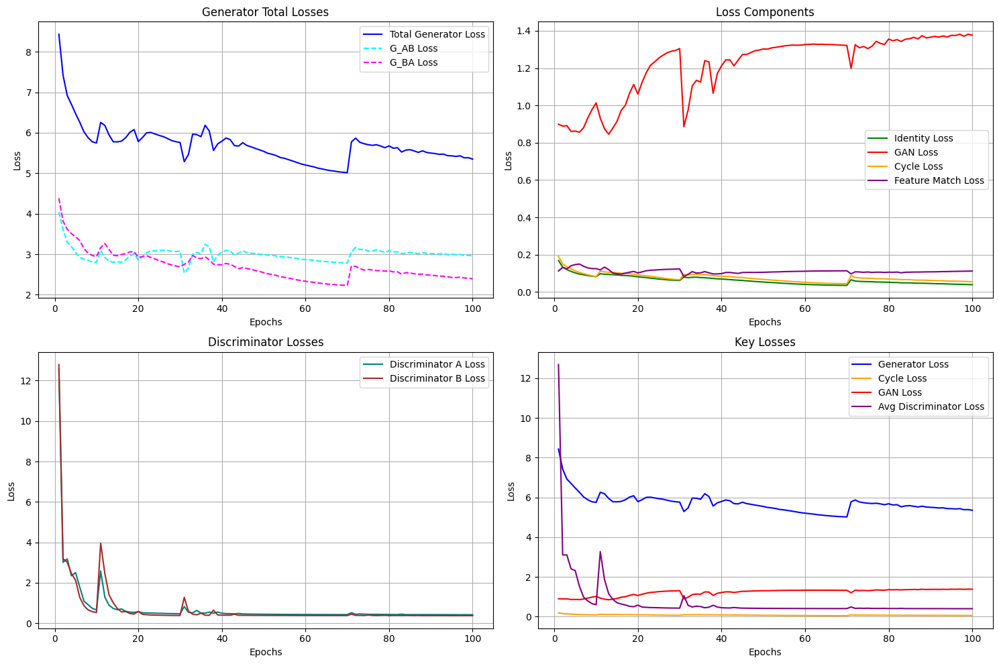

In [15]:
plot_losses(gen_loss_history, gen_AB_loss_history, gen_BA_loss_history,
           id_loss_history, gan_loss_history, cycle_loss_history, fm_loss_history,
           discA_loss_history, discB_loss_history)

In [16]:
%%script echo skipping --no-raise-error
save_checkpoint(G_AB, "G_AB", torch_seed)
save_checkpoint(G_BA, "G_BA", torch_seed)
save_checkpoint(D_A, "D_A", torch_seed)
save_checkpoint(D_B, "D_B", torch_seed)

Couldn't find program: 'echo'


In [17]:
%%script echo skipping --no-raise-error
def load_model(model, model_name):

    # Load the Checkpoing
    checkpoint = torch.load(f"models/{file_name}-{model_name}-best.pth")

    # Load the state dict into the model
    model.load_state_dict(checkpoint['model'])
    torch_seed = checkpoint['torch_seed']

    model.cuda()

    return model, torch_seed

Couldn't find program: 'echo'


In [18]:
%%script echo skipping --no-raise-error
G_AB, torch_seed = load_model(G_AB, "G_AB")
G_BA, torch_seed = load_model(G_BA, "G_BA")
D_A, torch_seed = load_model(D_A, "D_A")
D_B, torch_seed = load_model(D_B, "D_B")

Couldn't find program: 'echo'


## 5. Evaluation

In [19]:
%%script echo skipping --no-raise-error
"""
Step 8. Generate Images
"""
## Translation 1: Raw Image --> Cartoon Image
test_dir = os.path.join(data_dir, 'VAE_generation/test') # modification forbidden
files = [os.path.join(test_dir, name) for name in os.listdir(test_dir)]

save_dir = f'./generated_cartoon_images/{file_name}'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

to_image = transforms.ToPILImage()

G_AB.eval()
for i in range(0, len(files), batch_size):
    # read images
    imgs = []
    for j in range(i, min(len(files), i+batch_size)):
        img = Image.open(files[j])
        img = data_transforms(img)
        imgs.append(img)
    imgs = torch.stack(imgs, 0).type(Tensor)

    # generate
    fake_imgs = G_AB(imgs).detach().cpu()

    # save
    for j in range(fake_imgs.size(0)):
        img = fake_imgs[j].squeeze().permute(1, 2, 0)
        img_arr = img.numpy()
        img_arr = (img_arr - np.min(img_arr)) * 255 / (np.max(img_arr) - np.min(img_arr))
        img_arr = img_arr.astype(np.uint8)

        img = to_image(img_arr)
        _, name = os.path.split(files[i+j])
        img.save(os.path.join(save_dir, name))

gt_dir = os.path.join(data_dir, 'VAE_generation_Cartoon/test')
metrics = torch_fidelity.calculate_metrics(
    input1=save_dir,
    input2=gt_dir,
    cuda=True,
    fid=True,
    isc=True
)

fid_score = metrics["frechet_inception_distance"]
is_score = metrics["inception_score_mean"]

if is_score > 0:
    s_value_1 = np.sqrt(fid_score / is_score)
    print("Geometric Mean Score:", s_value_1)
else:
    print("IS is 0, GMS cannot be computed!")

Couldn't find program: 'echo'


In [20]:
%%script echo skipping --no-raise-error
## Translation 2: Cartoon Image --> Raw Image
test_dir = os.path.join(data_dir, 'VAE_generation_Cartoon/test') # modification forbidden
files = [os.path.join(test_dir, name) for name in os.listdir(test_dir)]

save_dir = f'./generated_raw_images/{file_name}'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

G_BA.eval()
for i in range(0, len(files), batch_size):
    # read images
    imgs = []
    for j in range(i, min(len(files), i+batch_size)):
        img = Image.open(files[j])
        img = data_transforms(img)
        imgs.append(img)
    imgs = torch.stack(imgs, 0).type(Tensor)

    # generate
    fake_imgs = G_BA(imgs).detach().cpu()

    # save
    for j in range(fake_imgs.size(0)):
        img = fake_imgs[j].squeeze().permute(1, 2, 0)
        img_arr = img.numpy()
        img_arr = (img_arr - np.min(img_arr)) * 255 / (np.max(img_arr) - np.min(img_arr))
        img_arr = img_arr.astype(np.uint8)

        img = to_image(img_arr)
        _, name = os.path.split(files[i+j])
        img.save(os.path.join(save_dir, name))

gt_dir = os.path.join(data_dir, 'VAE_generation/test')

metrics = torch_fidelity.calculate_metrics(
    input1 = save_dir,
    input2 = gt_dir,
    cuda = True,
    fid = True,
    isc = True
)

fid_score = metrics["frechet_inception_distance"]
is_score = metrics["inception_score_mean"]

if is_score > 0:
    s_value_2 = np.sqrt(fid_score / is_score)
    print("Geometric Mean Score:", s_value_2)
else:
    print("IS is 0, GMS cannot be computed!")

Couldn't find program: 'echo'


In [22]:
def evaluate(
    model: torch.nn.Module,
    input_dir: str,
    output_dir: str,
    ref_dir: str,
    batch_size: int,
    generate_transforms: transforms.Compose,
    verbose: bool = False
) -> float:

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    files = [os.path.join(input_dir, name) for name in os.listdir(input_dir)]

    model.eval()
    ############# ORIGINAL CODE ##############
    for i in range(0, len(files), batch_size):
        # Read and transform images
        imgs = [generate_transforms(Image.open(files[j])) for j in range(i, min(len(files), i + batch_size))]
        imgs = torch.stack(imgs, 0).type(Tensor)

        # Generate images
        fake_imgs = model(imgs).detach().cpu()

        # Save generated images
        for j in range(fake_imgs.size(0)):
            img = fake_imgs[j].squeeze().permute(1, 2, 0).numpy()
            img = (img - np.min(img)) * 255 / (np.max(img) - np.min(img))
            img = transforms.ToPILImage()(img.astype(np.uint8))
            _, name = os.path.split(files[i + j])
            img.save(os.path.join(output_dir, name))
    ##########################################


    # Compute metrics
    metrics: dict[str, float] = torch_fidelity.calculate_metrics(
        input1=output_dir,
        input2=ref_dir,
        cuda=True,
        fid=True,
        isc=True,
        verbose=verbose
    )

    fid_score: float = metrics["frechet_inception_distance"]
    is_score: float = metrics["inception_score_mean"]

    del imgs; del fake_imgs
    if is_score > 0:
        gms: float = np.sqrt(fid_score / is_score)
        print("Geometric Mean Score:", gms)
        return gms, fid_score, is_score
    else:
        print("IS is 0, GMS cannot be computed!")
        return 0, 0, 0

In [23]:
from collections import defaultdict
def format_score(score):
    return "{:.4f}".format(score).replace(".", "_")

def report_score(s_value_1, fid_1, is_1, s_value_2, fid_2, is_2, epoch=None):
    s_value = np.round((s_value_1+s_value_2)/2, 5)
    df = pd.DataFrame({'id': [1], 'label': [s_value]})
    filename = f"{format_score(s_value)}-C[{format_score(s_value_1)}-{format_score(fid_1)}-{format_score(is_1)}]-R[{format_score(s_value_2)}-{format_score(fid_2)}-{format_score(is_2)}]"
    if epoch: filename = f"{epoch}-{filename}"
    csv_path = filename+".csv"
    df.to_csv(csv_path, index=False)

    print(f"CSV saved to {csv_path}")



print("Processing saved model checkpoints...")
checkpoints_dir = 'checkpoints'
generator_weights = defaultdict(lambda: [None, None])
for filename in os.listdir(checkpoints_dir):
    model_type, domain, epoch_num = filename[:-4].split('_')
    if model_type == 'G':
        generator_weights[epoch_num][0 if domain == 'AB' else 1] = os.path.join(checkpoints_dir, filename) 

for epoch_num, (G_AB_path, G_BA_path) in generator_weights.items():
    # Process saved model
    G_AB.load_state_dict(torch.load(G_AB_path))
    G_BA.load_state_dict(torch.load(G_BA_path))
    print(f"Evaluating epoch {epoch_num}")

    print("Metrics for A -> B:", end=" ")
    # Raw to Cartoon
    s_value_1, fid_1, is_1 = evaluate(
        model=G_AB,
        input_dir=os.path.join(data_dir, 'VAE_generation/test'),
        output_dir='../Cartoon_images',
        ref_dir=f"{data_dir}/VAE_generation_Cartoon/test",
        batch_size=batch_size,
        generate_transforms=data_transforms
    )

    # Cartoon to Raw
    s_value_2, fid_2, is_2 = evaluate(
        model=G_BA,
        input_dir=os.path.join(data_dir, 'VAE_generation_Cartoon/test'),
        output_dir='../Raw_images',
        ref_dir=f"{data_dir}/VAE_generation/test",
        batch_size=batch_size,
        generate_transforms=data_transforms
    )

    report_score(s_value_1, fid_1, is_1, s_value_2, fid_2, is_2, epoch=epoch_num)

Processing saved model checkpoints...
Evaluating epoch 19
Metrics for A -> B: 

c:\Users\a\Desktop\cs424-project\venv313\Lib\site-packages\torch_fidelity\datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


Geometric Mean Score: 5.545634242636829
Geometric Mean Score: 5.4527883552223075
CSV saved to 19-5_4992-C[5_5456-92_4108-3_0048]-R[5_4528-103_4656-3_4798].csv
Evaluating epoch 29
Metrics for A -> B: Geometric Mean Score: 5.069834086304698
Geometric Mean Score: 4.699866173010346
CSV saved to 29-4_8849-C[5_0698-74_9750-2_9169]-R[4_6999-77_8780-3_5257].csv
Evaluating epoch 39
Metrics for A -> B: Geometric Mean Score: 5.138852597599002
Geometric Mean Score: 4.456474579970695
CSV saved to 39-4_7977-C[5_1389-75_5743-2_8618]-R[4_4565-71_0332-3_5767].csv
Evaluating epoch 49
Metrics for A -> B: Geometric Mean Score: 4.397471176563749
Geometric Mean Score: 3.8303179973812065
CSV saved to 49-4_1139-C[4_3975-46_0065-2_3791]-R[3_8303-52_6161-3_5863].csv
Evaluating epoch 59
Metrics for A -> B: Geometric Mean Score: 4.178001171542948
Geometric Mean Score: 3.4682757987431247
CSV saved to 59-3_8231-C[4_1780-39_4312-2_2589]-R[3_4683-43_2769-3_5977].csv
Evaluating epoch 69
Metrics for A -> B: Geometric M

In [21]:
s_value = np.round((s_value_1+s_value_2)/2, 5)
print(s_value)
df = pd.DataFrame({'id': [1], 'label': [s_value]})
csv_path = "zhirong.csv"
df.to_csv(csv_path, index=False)

print(f"CSV saved to {csv_path}")

NameError: name 's_value_1' is not defined